This notebook processes multiplexed ROI in TIFF files. Required files: 1) a TIFF file containing regions of interests stored as multiplexed images. 2) an additional marker file that maps each TIFF layer to the markers.


In [3]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import pickle as pkl
import skimage
import yaml
from typing import Union, Optional, Type, Tuple, List, Dict
import sys
from skimage.color import label2rgb
import json
# import nrrd
# Project Root
#TODO: change to path of the local repository
ROOT_DIR = '/project/Xie_Lab/zgu/xiao_multiplex/multiTAP'
sys.path.append(ROOT_DIR)
sys.path.append(os.path.join(ROOT_DIR, 'image_cytof'))

from cytof.hyperion_preprocess import cytof_read_data_roi
from cytof.utils import save_multi_channel_img, check_feature_distribution

/project/Xie_Lab/zgu/conda_stuff/envs/cytof-shared/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Set Parameters

- `filename` (str): full file path for input image
- `outdir` (str): output saving directory
- `slide` (str): name (identifier) for the slide
- `roi` (str): name (identifier) for the roi
- `quality_control_thres` (str): threshold for deciding whether or not keep this image  
- `channel_dict` (dict): keys are "nuclei" (required) and "membrane" (optional)
- `channels_remove` (list): a list of channel names to be discarded
- `use_membrane` (bool): whether or not use membrane channel as a guide in cell segmentation
- `cell_radius` (int): assumed cell radius
- `normalize_qs`: q values for percentile normalization

In [4]:
class SetParameters():
    def __init__(self, 
                 filename: str, 
                 outdir: str, 
                 label_marker_file: str, 
                 slide: Optional[str] = 'slide1', 
                 roi: Optional[str] = 'roi1', 
                 quality_control_thres: Optional[int] = 50,
                 channels_remove: Optional[List] = None, 
                 channels_dict: Optional[Dict] = None,
                 use_membrane: Optional[bool] = True,
                 cell_radius: Optional[int] = 5, 
                 normalize_qs: Optional[List[int]] = [75, 99]):
        
        self.filename = filename
        self.outdir   = outdir
        self.slide    = slide
        self.roi      = roi
        self.quality_control_thres = quality_control_thres
        self.label_marker_file     = label_marker_file
        self.channels_remove = channels_remove if channels_remove is not None else []
        self.channels_dict   = channels_dict if channels_dict is not None else {}
        self.use_membrane    = use_membrane
        self.cell_radius     = cell_radius
        self.normalize_qs    = normalize_qs

In [5]:
params = SetParameters(

    # TODO: change filename and other options here
    filename='/project/Xie_Lab/zgu/xiao_multiplex/breast_cancer_data_Basel/OMEandSingleCellMasks/OMEnMasks/ome/ome/BaselTMA_SP43_25.8kx22ky_10500x6500_8_20170928_114_115_X4Y8_262_a0_full.tiff',
    outdir="../test_out/tiffs/single_roi", 
    slide="BaselTMA_SP43_25.8kx22ky",
    roi="114_115_X4Y8_262",
    label_marker_file = "./supplemental/markers_labels_BrCa.txt",

## optional parameters to define
#     quality_control_thres=50,
#     channels_remove=[],
#     use_membrane=True,
#     cell_radius=5, 
#     normalize_qs=[75, 99]
)

## Section 1. Read and preprocess data

#### 1. read data: from a .tiff image

In [6]:
cytof_img, _ = cytof_read_data_roi(params.filename, slide=params.slide, roi=params.roi)

#### 2. quality control (set the `keep` attribute of `cytof_img`) and make saving directory for this ROI

In [ ]:
# performance quality control based on the specified threshold
cytof_img.quality_control(params.quality_control_thres)

# ****Creates a directory to note information on the ROI if desired****
# if cytof_img.keep:
#     # output directory for the roi
#     outdir = os.path.join(params.outdir, params.slide, params.roi)
#     print("Saving to {}".format(outdir))
#     if not os.path.exists(outdir):
#         os.makedirs(outdir)
        
#     dir_channelimg = os.path.join(outdir, "channel_images")
#     if not os.path.exists(dir_channelimg):
#         os.makedirs(dir_channelimg)
        
#     dir_feature = os.path.join(outdir, "feature")
#     if not os.path.exists(dir_feature):
#         os.makedirs(dir_feature)
        
#     # Create a "readme.txt" file and write information of original markers and channels into it    
#     f_info = open(os.path.join(outdir, 'readme.txt'), 'w')

Saving to ../test_out/tiffs/single_roi/BaselTMA_SP43_25.8kx22ky/114_115_X4Y8_262


#### 3. Load the list of channel names, protein markers correspond to each image channel


In [8]:
# set the channels and markers
labels_markers = yaml.load(open(params.label_marker_file, "rb"), Loader=yaml.Loader)
cytof_img.set_markers(**labels_markers) #markers=labels_markers["markers"], labels=labels_markers["labels"])

#### 4. (optional) check channels: get a glance of each channel image


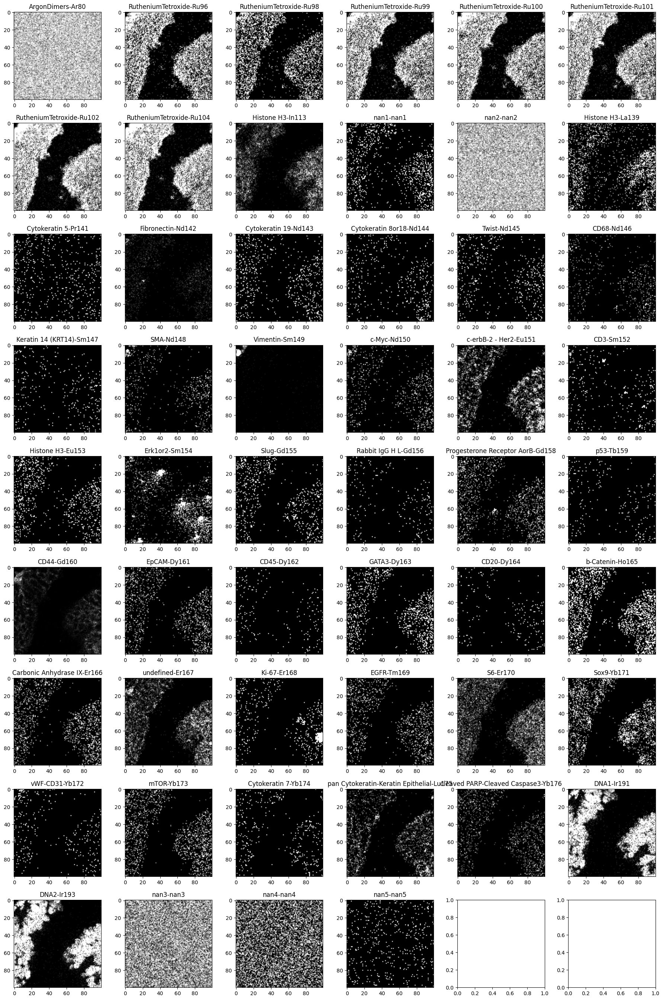

In [7]:
%matplotlib inline

cytof_img.check_channels(channels=None, xlim=[0,100], ylim=[0,100], ncols=6, vis_q=0.9, colorbar=False)

#### 5. (optional) save channel images

In [8]:
# # (optional) save channel images
# cytof_img.save_channel_images(dir_channelimg)
# cytof_img.save_channel_images(dir_channelimg, ext=".tiff")

dir_channelimg = os.path.join(params.outdir, "channel_images")
if not os.path.exists(dir_channelimg):
  os.makedirs(dir_channelimg)

#### 6. (optional) remove unwanted channels (change in "cids")
Use prior knowledge or take a close look at the channel images printed out to decide which channel(s) to discard;  
alternatively, take a look at the saved channel images if saved.  


In [9]:
#TODO: remove unwanted channels (and check visualization)
channels_remove = ['nan1-nan1', 'nan2-nan2', 'nan3-nan3', 'nan4-nan4', 'nan5-nan5']
setattr(params, "channels_remove", channels_remove)

In [10]:
if hasattr(params,"channels_remove") and len(params.channels_remove) > 0:
    cytof_img.remove_special_channels(params.channels_remove)
    
    # (optional) save channel images
    # cytof_img.save_channel_images(dir_channelimg)
    
    print("Original list of channels: \n{}".format(', '.join(cytof_img.raw_channels)))
    print("\nUpdated list of channels: \n{}".format(', '.join(cytof_img.channels)))
    
    # (optional) check channels after removing unwanted channels: get a glance of each channel image
    # cytof_img.check_channels(channels=None, xlim=[50,200], ylim=[50,200], ncols=8, vis_q=0.9, colorbar=False)

Original list of channels: 
ArgonDimers-Ar80, RutheniumTetroxide-Ru96, RutheniumTetroxide-Ru98, RutheniumTetroxide-Ru99, RutheniumTetroxide-Ru100, RutheniumTetroxide-Ru101, RutheniumTetroxide-Ru102, RutheniumTetroxide-Ru104, Histone H3-In113, nan1-nan1, nan2-nan2, Histone H3-La139, Cytokeratin 5-Pr141, Fibronectin-Nd142, Cytokeratin 19-Nd143, Cytokeratin 8or18-Nd144, Twist-Nd145, CD68-Nd146, Keratin 14 (KRT14)-Sm147, SMA-Nd148, Vimentin-Sm149, c-Myc-Nd150, c-erbB-2 - Her2-Eu151, CD3-Sm152, Histone H3-Eu153, Erk1or2-Sm154, Slug-Gd155, Rabbit IgG H L-Gd156, Progesterone Receptor AorB-Gd158, p53-Tb159, CD44-Gd160, EpCAM-Dy161, CD45-Dy162, GATA3-Dy163, CD20-Dy164, b-Catenin-Ho165, Carbonic Anhydrase IX-Er166, undefined-Er167, Ki-67-Er168, EGFR-Tm169, S6-Er170, Sox9-Yb171, vWF-CD31-Yb172, mTOR-Yb173, Cytokeratin 7-Yb174, pan Cytokeratin-Keratin Epithelial-Lu175, cleaved PARP-Cleaved Caspase3-Yb176, DNA1-Ir191, DNA2-Ir193, nan3-nan3, nan4-nan4, nan5-nan5

Updated list of channels: 
ArgonDime

### Visualize as pseudocolored images
Multiple options available

In [11]:
print(cytof_img.channels)

['ArgonDimers-Ar80', 'RutheniumTetroxide-Ru96', 'RutheniumTetroxide-Ru98', 'RutheniumTetroxide-Ru99', 'RutheniumTetroxide-Ru100', 'RutheniumTetroxide-Ru101', 'RutheniumTetroxide-Ru102', 'RutheniumTetroxide-Ru104', 'Histone H3-In113', 'Histone H3-La139', 'Cytokeratin 5-Pr141', 'Fibronectin-Nd142', 'Cytokeratin 19-Nd143', 'Cytokeratin 8or18-Nd144', 'Twist-Nd145', 'CD68-Nd146', 'Keratin 14 (KRT14)-Sm147', 'SMA-Nd148', 'Vimentin-Sm149', 'c-Myc-Nd150', 'c-erbB-2 - Her2-Eu151', 'CD3-Sm152', 'Histone H3-Eu153', 'Erk1or2-Sm154', 'Slug-Gd155', 'Rabbit IgG H L-Gd156', 'Progesterone Receptor AorB-Gd158', 'p53-Tb159', 'CD44-Gd160', 'EpCAM-Dy161', 'CD45-Dy162', 'GATA3-Dy163', 'CD20-Dy164', 'b-Catenin-Ho165', 'Carbonic Anhydrase IX-Er166', 'undefined-Er167', 'Ki-67-Er168', 'EGFR-Tm169', 'S6-Er170', 'Sox9-Yb171', 'vWF-CD31-Yb172', 'mTOR-Yb173', 'Cytokeratin 7-Yb174', 'pan Cytokeratin-Keratin Epithelial-Lu175', 'cleaved PARP-Cleaved Caspase3-Yb176', 'DNA1-Ir191', 'DNA2-Ir193']


In [12]:
vis_range = {
    'h0': 500,
    'h1': 800,
    'w0': 0,
    'w1': 300
}

#TODO: (option 1.1) change channel names here
# vis_channel_names = ['DAPI-DNA', 'Opal 480-CD8a','Opal 570-MCT1', 'Opal 620-MCT4', 'Opal 520-CD31']
vis_channel_names = ['Vimentin-Sm149','DNA1-Ir191','c-erbB-2 - Her2-Eu151',
                     'pan Cytokeratin-Keratin Epithelial-Lu175','Histone H3-In113', 'CD44-Gd160',
                    'Fibronectin-Nd142']
                    
#TODO: (option 1.2) change channel ids here
# vis_channel_ids   = [0,1,2,3]
vis_channel_ids   = [27, 46, 7]

##### (option 1) visualize selected channels in pseudoRGB and save, using channel names

Visualizing channels: Vimentin-Sm149, DNA1-Ir191, c-erbB-2 - Her2-Eu151, pan Cytokeratin-Keratin Epithelial-Lu175, Histone H3-In113, CD44-Gd160, Fibronectin-Nd142
Visualizing... 
Vimentin-Sm149 in red
DNA1-Ir191 in green
c-erbB-2 - Her2-Eu151 in blue
pan Cytokeratin-Keratin Epithelial-Lu175 in cyan
Histone H3-In113 in magenta
CD44-Gd160 in yellow
Fibronectin-Nd142 in white



/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/cytof/multiTAP_clean/multiTAP/image_cytof/cytof/classes.py:271: UserWarning: Visualizing more than 3 channels the same time results in deteriorated visualization.                 It is not recommended!
  warnings.warn(


(-0.5, 299.5, 281.5, -0.5)

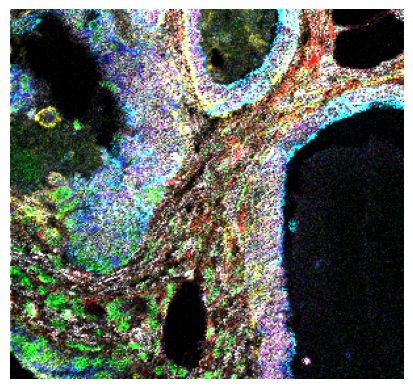

In [13]:
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                                                              visualize=False)
fig, ax = plt.subplots(1,1)
ax.imshow(pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :])
plt.axis('off')

# save visualization
# _channel_ids = [cytof_img.channels.index(_) for _ in vis_channel_names]
# save_multi_channel_img(
#     skimage.img_as_ubyte(
#         pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(dir_channelimg, 
#                  "fig3_channels_{}.png".format('_'.join([cytof_img.markers[x] for x in _channel_ids]))
#                 ))

##### (option 2) visualize selected channels in pseudoRGB and save using channel indices

Visualizing channels: p53-Tb159, DNA2-Ir193, RutheniumTetroxide-Ru104
Visualizing... 
p53-Tb159 in red
DNA2-Ir193 in green
RutheniumTetroxide-Ru104 in blue



(-0.5, 299.5, 281.5, -0.5)

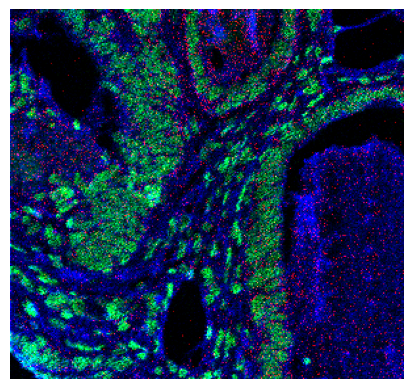

In [14]:
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_ids=vis_channel_ids, 
                                                                              visualize=False)
fig, ax = plt.subplots(1,1)
ax.imshow(pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :])
plt.axis('off')

# save_multi_channel_img(
#     skimage.img_as_ubyte(
#         pseudoRGB[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(dir_channelimg, 
#                  "fig3_channels_{}.png".format('_'.join([cytof_img.markers[x] for x in vis_channel_ids]))
#                 ))

##### (option 3) visualize selected one channel in specified color (choose from "red", "green", and "blue")

(-0.5, 299.5, 281.5, -0.5)

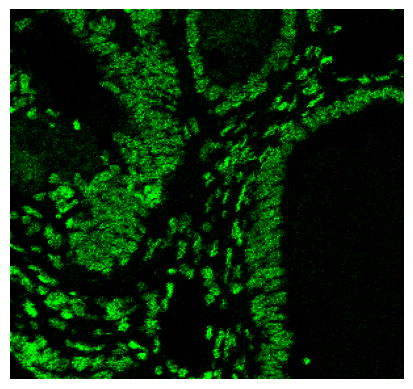

In [15]:
#TODO: change channel name here
channel_name = 'DNA1-Ir191'
color = "green"

vis_im = cytof_img.visualize_single_channel(channel_name=channel_name, color=color)
fig, ax = plt.subplots(1,1)
ax.imshow(vis_im[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :])
plt.axis('off')

# _channel_ids = [cytof_img.channels.index(_) for _ in vis_channel_names]
# save_multi_channel_img(
#     skimage.img_as_ubyte(vis_im[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(dir_channelimg, "channel_{}_in_{}.png".format(channel_name, color)))

### Define special channel(s)
Define nuclei channel, optionally, define membrane channel, to get prepared for nuclei and cells segmentation.  

In [16]:
#TODO: change accordingly
channel_dict = {
        'nuclei': ['DNA1-Ir191', 'DNA2-Ir193'],
        'membrane': ['Vimentin-Sm149', 'c-erbB-2 - Her2-Eu151', 'pan Cytokeratin-Keratin Epithelial-Lu175', 
                     'CD44-Gd160','Fibronectin-Nd142'], 
    }

setattr(params, 'channel_dict', channel_dict)

In [17]:
channels_ = cytof_img.channels[:]

# define special channels (if desired)
channels_rm = cytof_img.define_special_channels(params.channel_dict, rm_key='nuclei')

# # remove unwanted channels (if desired)
# if not params.keep_origs: # if not keeping original channels
cytof_img.remove_special_channels(channels_rm)

print("\nList of channels before defining special channel(s): \n{}".format(', '.join(channels_)))
print("\nUpdated list of channels after defining special channel(s): \n{}".format(', '.join(cytof_img.channels)))


List of channels before defining special channel(s): 
ArgonDimers-Ar80, RutheniumTetroxide-Ru96, RutheniumTetroxide-Ru98, RutheniumTetroxide-Ru99, RutheniumTetroxide-Ru100, RutheniumTetroxide-Ru101, RutheniumTetroxide-Ru102, RutheniumTetroxide-Ru104, Histone H3-In113, Histone H3-La139, Cytokeratin 5-Pr141, Fibronectin-Nd142, Cytokeratin 19-Nd143, Cytokeratin 8or18-Nd144, Twist-Nd145, CD68-Nd146, Keratin 14 (KRT14)-Sm147, SMA-Nd148, Vimentin-Sm149, c-Myc-Nd150, c-erbB-2 - Her2-Eu151, CD3-Sm152, Histone H3-Eu153, Erk1or2-Sm154, Slug-Gd155, Rabbit IgG H L-Gd156, Progesterone Receptor AorB-Gd158, p53-Tb159, CD44-Gd160, EpCAM-Dy161, CD45-Dy162, GATA3-Dy163, CD20-Dy164, b-Catenin-Ho165, Carbonic Anhydrase IX-Er166, undefined-Er167, Ki-67-Er168, EGFR-Tm169, S6-Er170, Sox9-Yb171, vWF-CD31-Yb172, mTOR-Yb173, Cytokeratin 7-Yb174, pan Cytokeratin-Keratin Epithelial-Lu175, cleaved PARP-Cleaved Caspase3-Yb176, DNA1-Ir191, DNA2-Ir193

Updated list of channels after defining special channel(s): 
Arg

### Visualizations after defining special channels

##### (option 1) check channels: get a glance of each added channel image

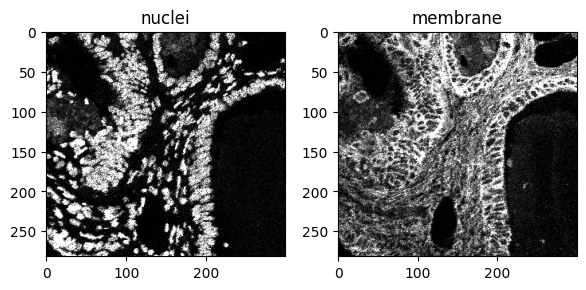

In [18]:
vis_channels = [k for (k, itm) in params.channel_dict.items() if len(itm)>0] #['nuclei', 'membrane']
cytof_img.check_channels(channels=vis_channels, 
                          xlim=[vis_range['w0'],vis_range['w1']], 
                          ylim=[vis_range['h0'],vis_range['h1']], ncols=8, vis_q=0.9, colorbar=False)

##### (option 2) visualize more than one channel in pseudo-colored image (with specified color)

Visualizing channels: nuclei, membrane
Visualizing... 
nuclei in red
membrane in green



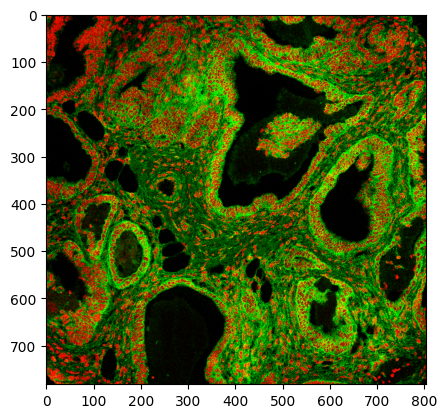

(-0.5, 199.5, 199.5, -0.5)

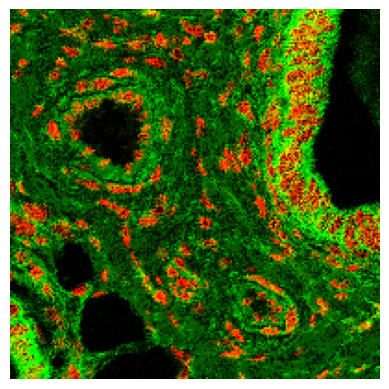

In [19]:
#TODO: change accordingly based on membrane info
# vis_channels_RGB = ['nuclei']
vis_channels_RGB = ['nuclei','membrane']

pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channels_RGB, 
                                                                              visualize=True)

fig, ax = plt.subplots(1,1)
ax.imshow(pseudoRGB[300:500, 200:400,:])
plt.axis('off')

# save_multi_channel_img(skimage.img_as_ubyte(pseudoRGB[300:500, 200:400 :]), 
#                         os.path.join(dir_channelimg, 
#                                      "channels_{}.png".format('_'.join(vis_channels_RGB))))

##### save newly added channel images if desired

In [20]:
# cytof_img.save_channel_images(dir_channelimg, channels=vis_channels)

Append the updated information to the .txt file created previously, if desired

In [21]:
# f_info.write("Original markers: ")
# f_info.write('\n{}'.format(", ".join(cytof_img.raw_markers)))
# f_info.write("\nOriginal channels: ")
# f_info.write('\n{}'.format(", ".join(cytof_img.raw_channels)))

# f_info.write("\nChannels removed: ")
# f_info.write("\n{}".format(", ".join(params.channels_remove+channels_rm)))
# f_info.write("\nFinal markers: ")
# f_info.write("\n{}".format(', '.join(cytof_img.markers)))
# f_info.write("\nFinal channels: ")
# f_info.write("\n{}".format(', '.join(cytof_img.channels)))
# f_info.close()

## Section 2. Nuclei and cells segmentation
With the nuclei channel (and membrane channel) defined, nuclei and cells segmentation can be easily done with the class method `get_seg()`.  
`cytof_img.get_seg()`

#### Get nuclei and cell segmentation

In [22]:
print(params.use_membrane)

True


Nuclei segmentation...


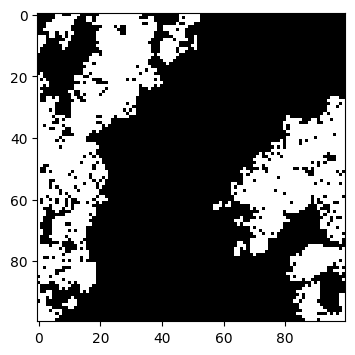

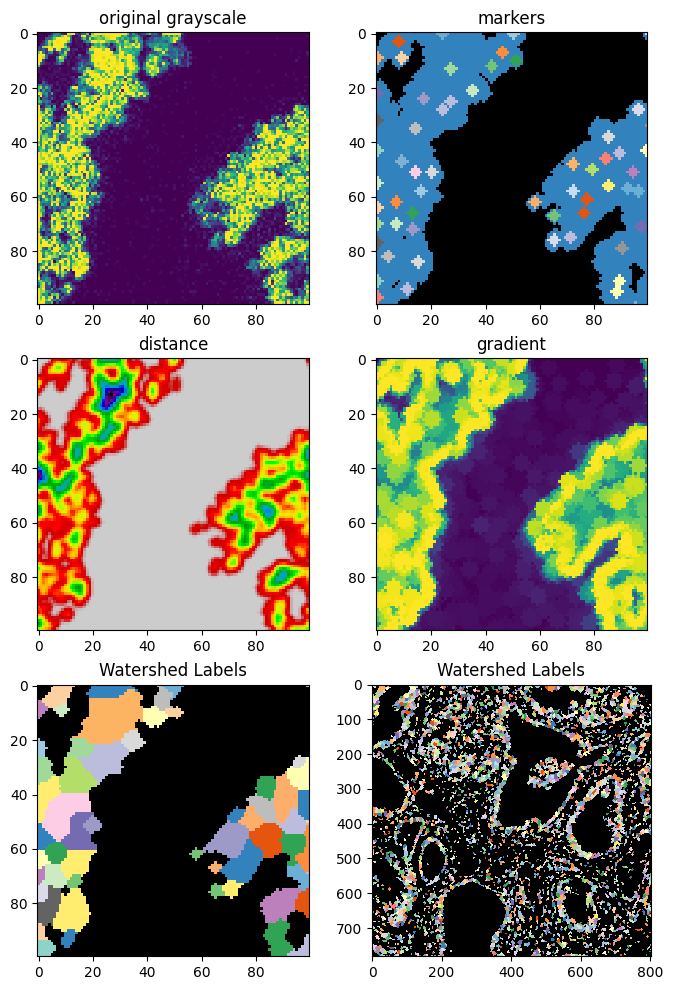

Cell segmentation...


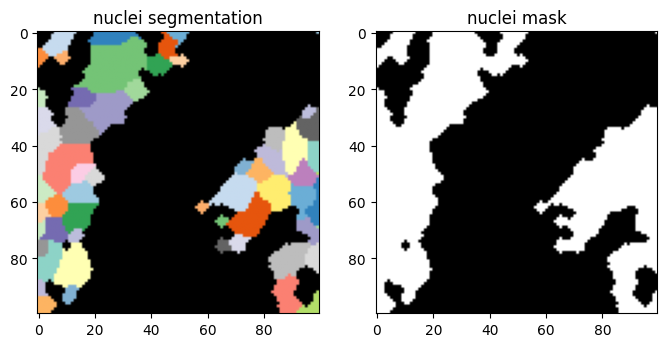

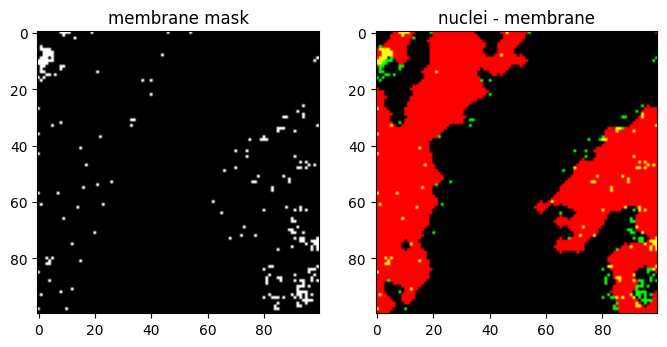

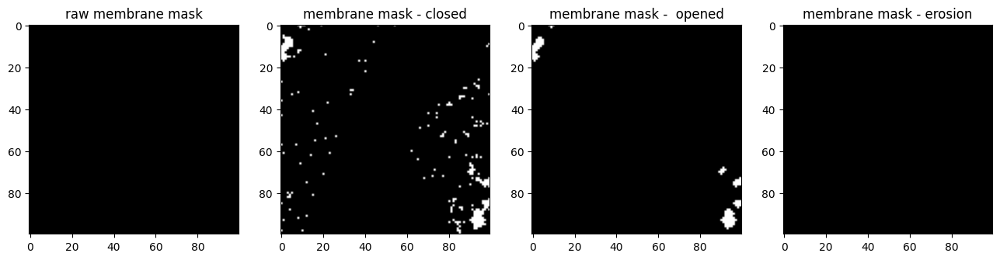

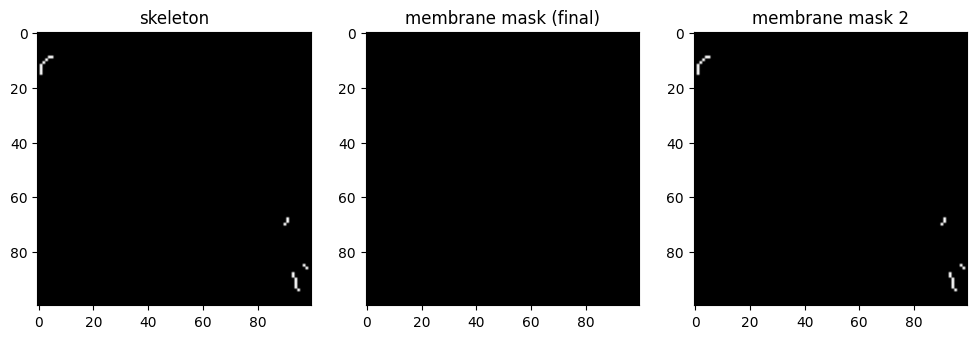

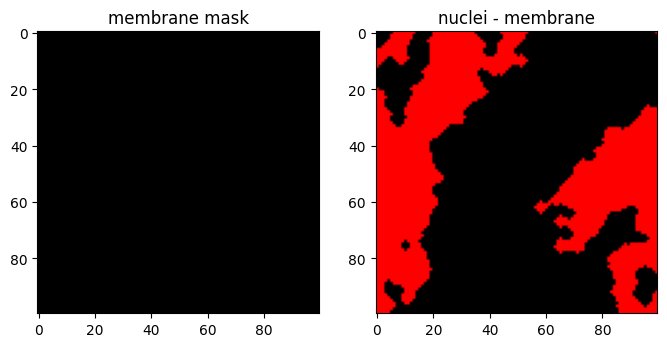

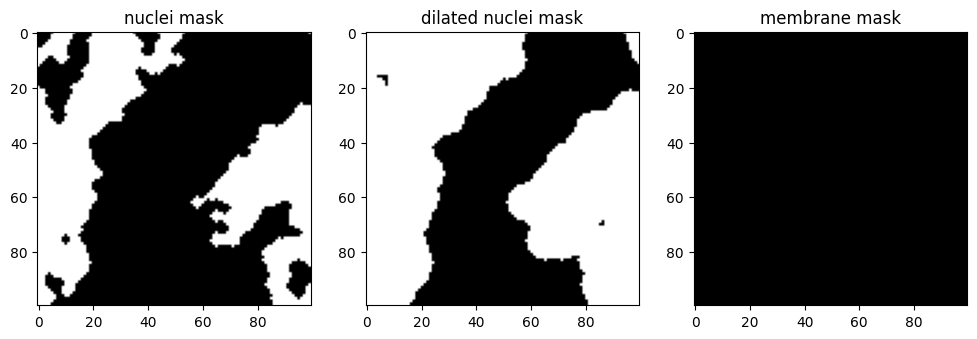

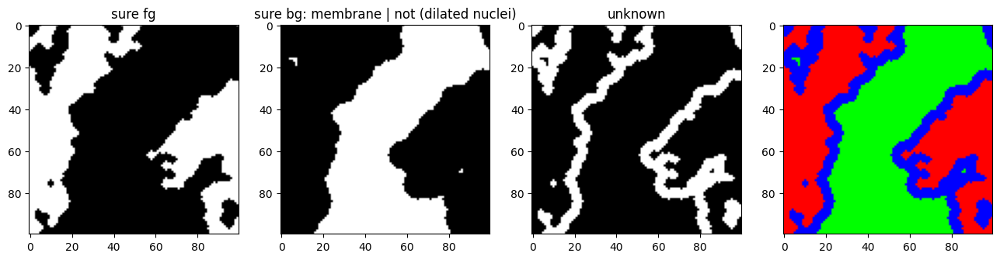

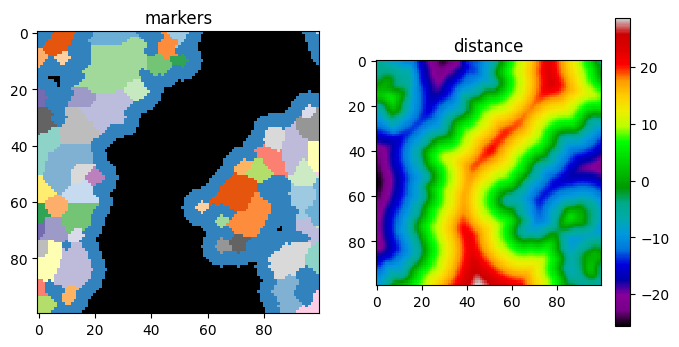

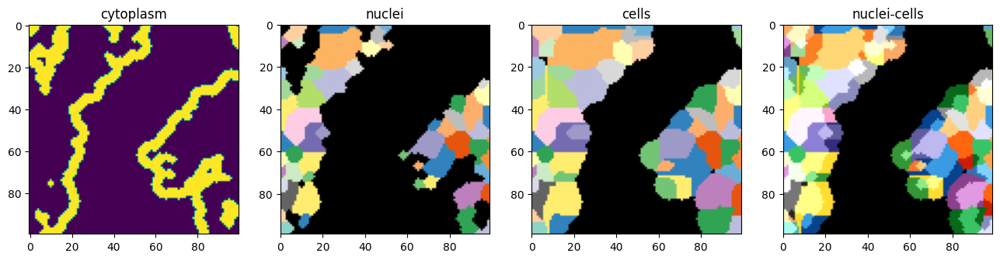

In [23]:
%matplotlib inline

nuclei_seg, cell_seg = cytof_img.get_seg(use_membrane=params.use_membrane, 
                                         radius=params.cell_radius, # 10
                                         show_process=True)

### Visualizations of nuclei and cells segmentation

#### Compare segmentation results

In [24]:
# set color map to prettify
cmap_set3 = plt.get_cmap("Set3")
cmap_tab20c = plt.get_cmap("tab20c")
colors = [cmap_tab20c.colors[_] for _ in range(len(cmap_tab20c.colors))] + \
    [cmap_set3.colors[_] for _ in range(len(cmap_set3.colors))]

# choosing a subsection
vis_range = {
'h0': 300,
'h1': 500,
'w0': 200,
'w1': 400
}

In [25]:
CP_TITAN_PATH = '/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/cytof/image_cytof/notebooks/developer'
IMC_FOLDER = '/archive/DPDS/Xiao_lab/shared/shidan/hyperion/The Single-Cell Pathology Landscape of Breast Cancer/OMEandSingleCellMasks/OMEnMasks/ome/ome'
IMC_MASKS_FOLDER = '/archive/DPDS/Xiao_lab/shared/shidan/hyperion/The Single-Cell Pathology Landscape of Breast Cancer/OMEandSingleCellMasks/OMEnMasks/Basel_Zuri_masks/Basel_Zuri_masks'
CP_MASK_PATH = '/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/cytof/image_cytof/notebooks/developer/roi_masks/cellprofiler/'
TITAN_MASK_PATH = '/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/cytof/image_cytof/notebooks/developer/roi_masks/titan/nrrd_keep'

imc_file = 'BaselTMA_SP43_25.8kx22ky_10500x6500_8_20170928_114_115_X4Y8_262_a0_full.tiff'

# find CellProfiler and TITAN results
# load the roi -> imc mapping file
roi_name_dict = json.load(open(os.path.join(CP_TITAN_PATH, 'roi_num_imc_name_map.json')))

roi_num = list(roi_name_dict.values()).index(imc_file)

# check the filenames match
assert roi_name_dict[f'rois/roi{roi_num}'] == imc_file

# load the CP masks result
cell_seg_cellprofiler = skimage.io.imread(os.path.join(CP_MASK_PATH, f'roi{roi_num}_cell_masks.tiff'), plugin="tifffile")

# load the TITAN masks result
cell_seg_titan, _ = nrrd.read(os.path.join(TITAN_MASK_PATH, f'roi{roi_num} Cell Mask.nrrd'))
cell_seg_titan = np.transpose(cell_seg_titan, axes=(1,0,2))[:,:,0] # TITAN processing always transposes the original images

# load ground truth
cell_seg_gt = skimage.io.imread(os.path.join(IMC_MASKS_FOLDER, imc_file.split('.tiff')[0]+"_maks.tiff"), plugin='tifffile')
  
cell_seg_pred = cell_seg - 1 # to match with gt label

# label the segmentation with better color
cell_seg_gt = label2rgb(cell_seg_gt, bg_label=0, colors=colors)
cell_seg_pred = label2rgb(cell_seg_pred, bg_label=0, colors=colors)
cell_seg_cellprofiler = label2rgb(cell_seg_cellprofiler, bg_label=0, colors=colors)
cell_seg_titan = label2rgb(cell_seg_titan, bg_label=0, colors=colors)



(-0.5, 199.5, 199.5, -0.5)

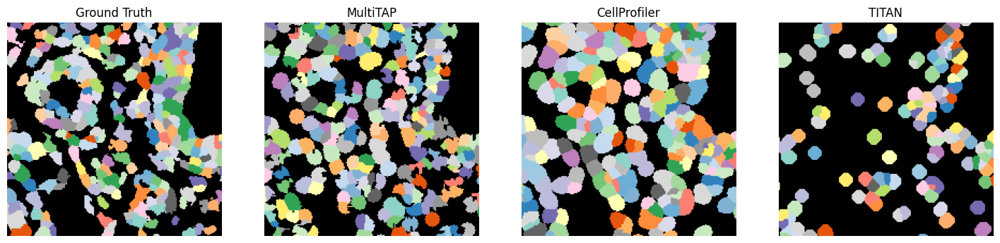

In [26]:

# visualize the results with ground truth
fig, axs = plt.subplots(1,4, figsize=(18,6))
axs[0].imshow(cell_seg_gt[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1']])
axs[0].set_title("Ground Truth")

axs[1].imshow(cell_seg_pred[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1']])
axs[1].set_title("MultiTAP")

axs[2].imshow(cell_seg_cellprofiler[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1']])
axs[2].set_title("CellProfiler")

axs[3].imshow(cell_seg_titan[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1']])
axs[3].set_title("TITAN")

# turn off axis
axs[0].axis('off')
axs[1].axis('off')
axs[2].axis('off')
axs[3].axis('off')

# plt.savefig('perform_comp.png', dpi=300)

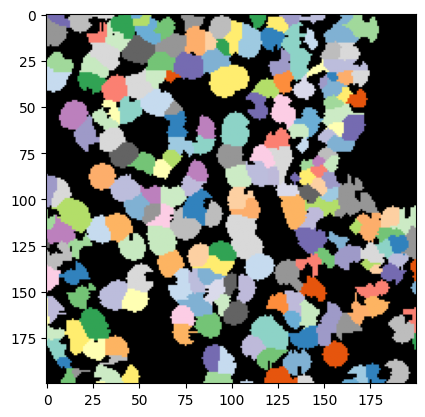

In [27]:
cell_lb = label2rgb(cell_seg, bg_label=1, colors=colors)
plt.imshow(cell_lb[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1']])

Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow


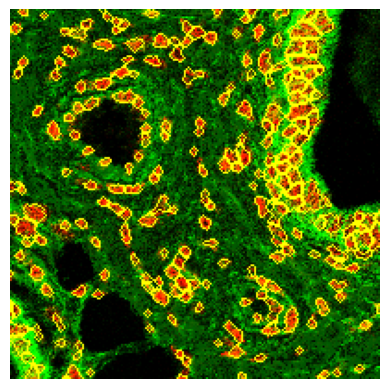

In [28]:

marked_image_nuclei = cytof_img.visualize_seg(segtype="nuclei", show=False)
plt.imshow(marked_image_nuclei[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:])
plt.axis('off')
plt.show()

# # (optional) save segmentation visualization
# _save_multi_channel_img(skimage.img_as_ubyte(marked_image_nuclei), os.path.join(savedir, "nuclei_seg.png"))
# save_multi_channel_img(
#     skimage.img_as_ubyte(marked_image_nuclei[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:]), 
#     os.path.join(outdir, "nuclei_seg_subset.png"))

Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


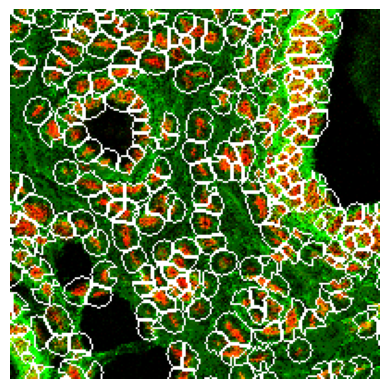

In [29]:
# visualize cell segmentation with boundaries marked
# note: showing a selected region
marked_image_cell = cytof_img.visualize_seg(segtype="cell", show=False)
plt.imshow(marked_image_cell[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'],:])
plt.axis('off')
plt.show()

# # (optional) save segmentation visualization
# _save_multi_channel_img(skimage.img_as_ubyte(marked_image_cell), os.path.join(savedir, "cell_seg.png"))
# save_multi_channel_img(
#     skimage.img_as_ubyte(marked_image_cell[vis_range['h0']:vis_range['h1'], vis_range['w0']:vis_range['w1'], :]), 
#     os.path.join(outdir, "cell_seg_subset.png"))

### (Optional) Run multiple experiments
Testing a combination of using membrane and cell radius. 


Not using membrane, 3
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


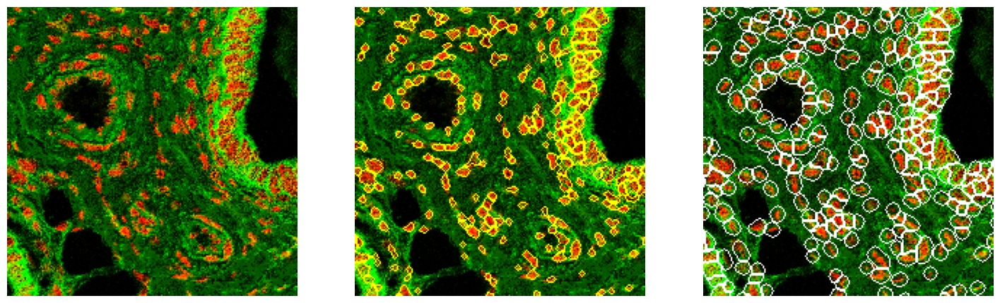


Not using membrane, 5
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


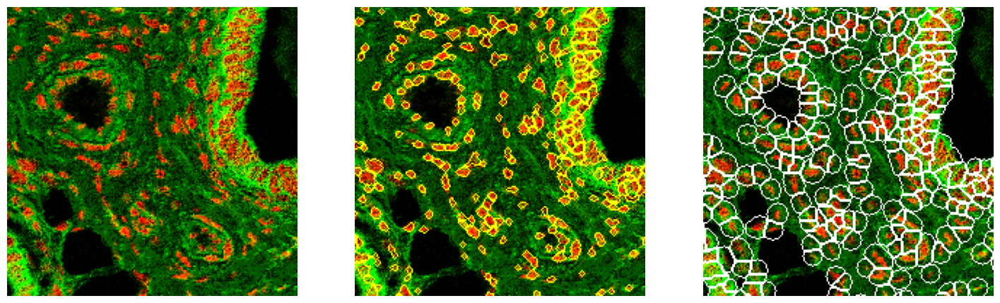


Not using membrane, 10
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


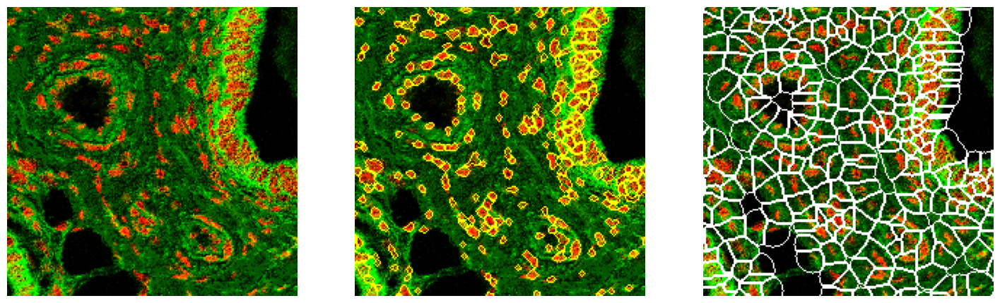


Using membrane, 3
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


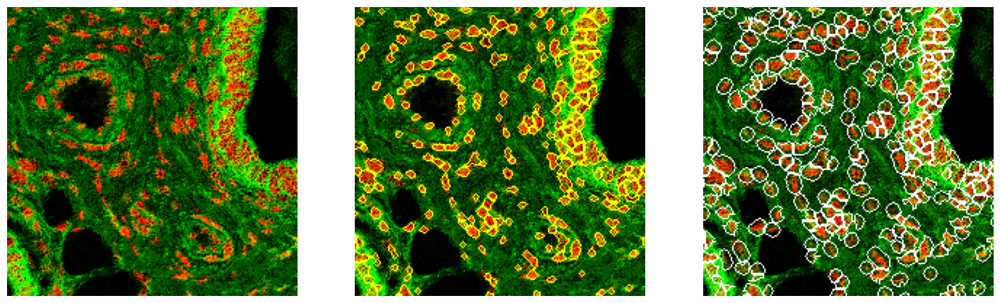


Using membrane, 5
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


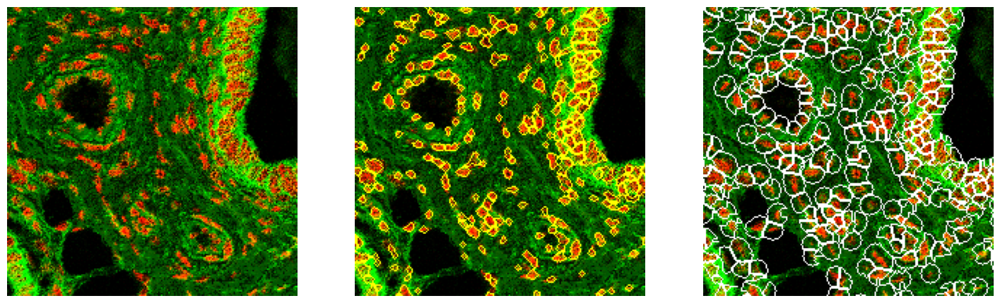


Using membrane, 10
3684 nuclei
Visualizing... 
nuclei in red
membrane in green

nuclei boundary marked by yellow
Visualizing... 
nuclei in red
membrane in green

cell boundary marked by white


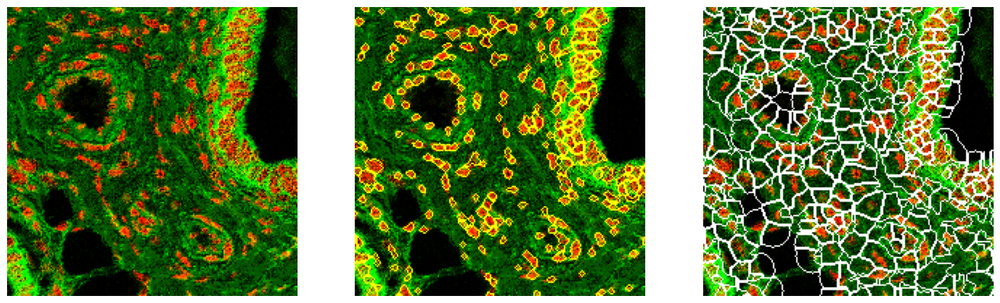

In [30]:
nuclei_segs, cell_segs = {}, {}
marked_img_nuclei, marked_img_cell = {}, {}

for use_membrane in [False, True]:
    for radius in [3, 5, 10]:
        if use_membrane:
            print("\nUsing membrane, {}".format(radius))
            key = "mem-"
        else:
            print("\nNot using membrane, {}".format(radius))
            key = "nomem-"
        nuclei_seg, cell_seg = cytof_img.get_seg(use_membrane=use_membrane, radius=radius)
        print("{} nuclei".format(len(np.unique(nuclei_seg))))
        key += str(radius)
        nuclei_segs[key] = nuclei_seg
        cell_segs[key]   = cell_seg
        
#         marked_img_nuclei[key]  = visualize_seg(cytof_img, seg=nuclei_seg)
#         marked_img_cell[key]    = visualize_seg(cytof_img, seg=cell_seg)
        
        marked_img_nuclei[key]  = cytof_img.visualize_seg(segtype="nuclei")
        marked_img_cell[key]    = cytof_img.visualize_seg(segtype="cell")
        
        fig, axs = plt.subplots(1,3, figsize=(18,6))
        # fig, axs = plt.subplots(1,4, figsize=(24,6))
        axs[0].imshow(pseudoRGB[300:500,200:400])
        axs[1].imshow(marked_img_nuclei[key][300:500,200:400])
        axs[2].imshow(marked_img_cell[key][300:500,200:400])
        for ax in axs:
            ax.axis("off")
        # plt.savefig(os.path.join(dir_channelimg, "seg_{}.png".format(key)))
        plt.show()

#### Save the `CytofImage` class instance as a pickle file.

In [31]:
# savename_cytof_img = os.path.join(outdir, "cytof_img.pkl")
# cytof_img.save_cytof(savename_cytof_img)

## Section 3. Feature extraction
With nuclei and cells segmented, single-nucleus and single-cell features can be extracted with class method `extract_feature`.  
`extract_feature`, `check_feature_distribution`

In [32]:
import time
start_time = time.time()
cytof_img.extract_features(params.filename)
print(f"Runtime for feature extraction: {(time.time() - start_time)/60} min")
cytof_img.df_feature.sample(5)

Runtime for feature extraction: 10.139784713586172 min


,filename,id,coordinate_x,coordinate_y,area_nuclei,area_cell,convex_area_nuclei,convex_area_cell,eccentricity_nuclei,eccentricity_cell,...,Cytokeratin 7-Yb174_cell_sum,Cytokeratin 7-Yb174_cell_ave,pan Cytokeratin-Keratin Epithelial-Lu175_nuclei_sum,pan Cytokeratin-Keratin Epithelial-Lu175_nuclei_ave,pan Cytokeratin-Keratin Epithelial-Lu175_cell_sum,pan Cytokeratin-Keratin Epithelial-Lu175_cell_ave,cleaved PARP-Cleaved Caspase3-Yb176_nuclei_sum,cleaved PARP-Cleaved Caspase3-Yb176_nuclei_ave,cleaved PARP-Cleaved Caspase3-Yb176_cell_sum,cleaved PARP-Cleaved Caspase3-Yb176_cell_ave
1317,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,1319,550.794118,236.500000,34,34,37,37,0.660389,0.660389,...,15.066999,0.443147,304.697021,8.961678,304.697021,8.961678,86.306999,2.538441,86.306999,2.538441
3277,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,3279,129.500000,685.852941,34,135,38,154,0.628621,0.890955,...,5.600000,0.041481,3.272000,0.096235,5.743999,0.042548,10.589000,0.311441,49.748001,0.368504
21,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,23,496.666667,2.055556,36,59,40,63,0.666895,0.880191,...,35.534000,0.602271,242.076019,6.724334,473.131989,8.019186,35.016003,0.972667,70.145004,1.188898
861,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,863,569.725806,150.887097,62,64,66,70,0.457240,0.487060,...,7.033000,0.109891,159.024002,2.564903,165.059998,2.579062,69.420998,1.119694,71.727005,1.120734
1404,/archive/DPDS/Xiao_lab/shared/shidan/hyperion/...,1406,240.297872,252.063830,47,96,55,114,0.634854,0.826185,...,14.566000,0.151729,191.836975,4.081638,596.494019,6.213480,27.789000,0.591255,62.114998,0.647031


In [33]:
# (optional) save extracted feature
# cytof_img.df_feature.to_csv(os.path.join(dir_feature, "feature_summary.csv"), index=False)

#### Check feature distribution

ArgonDimers-Ar80_cell_sum


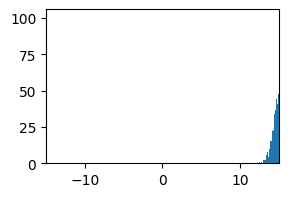

RutheniumTetroxide-Ru96_cell_sum


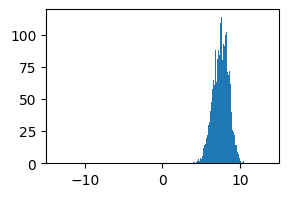

RutheniumTetroxide-Ru98_cell_sum


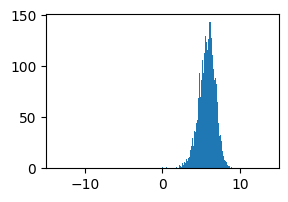

RutheniumTetroxide-Ru99_cell_sum


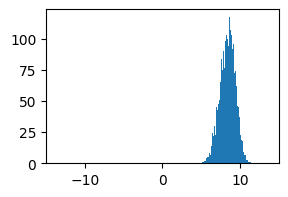

RutheniumTetroxide-Ru100_cell_sum


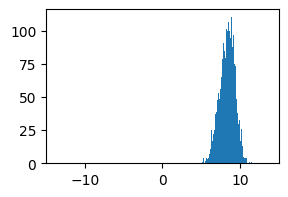

RutheniumTetroxide-Ru101_cell_sum


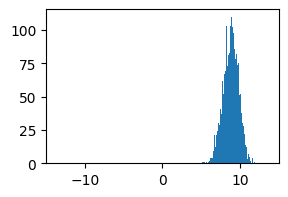

RutheniumTetroxide-Ru102_cell_sum


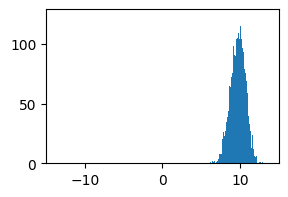

RutheniumTetroxide-Ru104_cell_sum


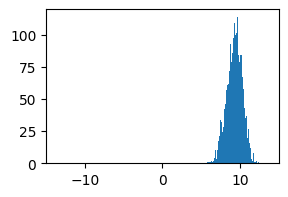

Histone H3-In113_cell_sum


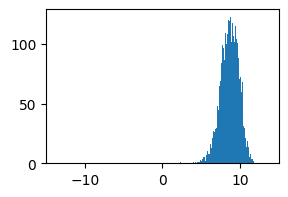

Histone H3-La139_cell_sum


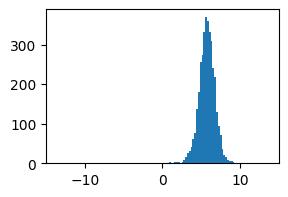

Cytokeratin 5-Pr141_cell_sum


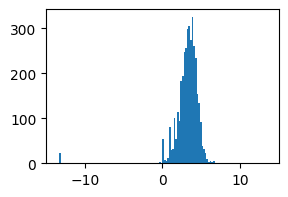

Fibronectin-Nd142_cell_sum


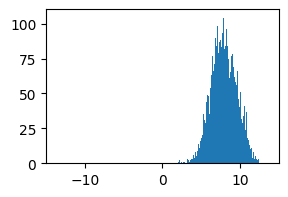

Cytokeratin 19-Nd143_cell_sum


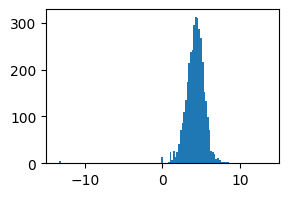

Cytokeratin 8or18-Nd144_cell_sum


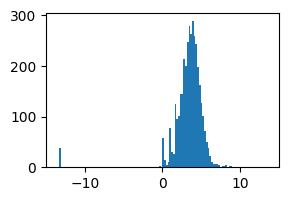

Twist-Nd145_cell_sum


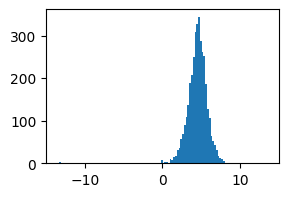

CD68-Nd146_cell_sum


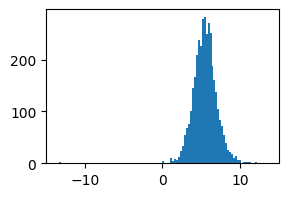

Keratin 14 (KRT14)-Sm147_cell_sum


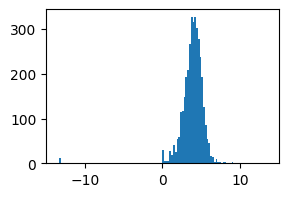

SMA-Nd148_cell_sum


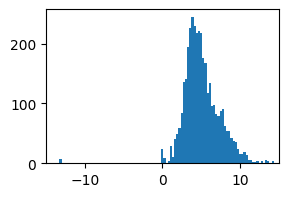

Vimentin-Sm149_cell_sum


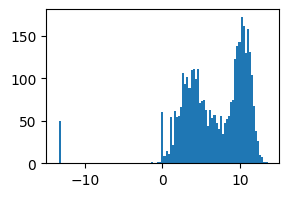

c-Myc-Nd150_cell_sum


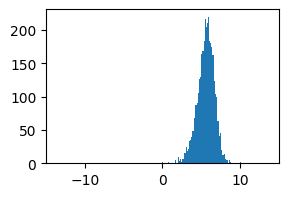

c-erbB-2 - Her2-Eu151_cell_sum


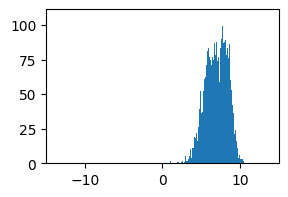

CD3-Sm152_cell_sum


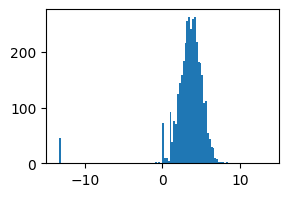

Histone H3-Eu153_cell_sum


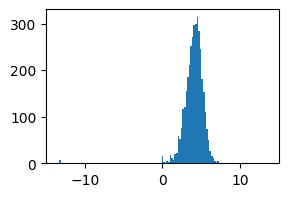

Erk1or2-Sm154_cell_sum


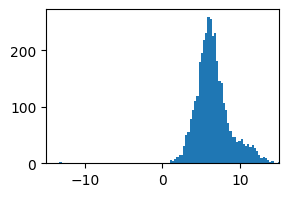

Slug-Gd155_cell_sum


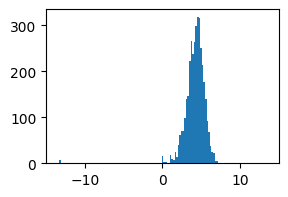

Rabbit IgG H L-Gd156_cell_sum


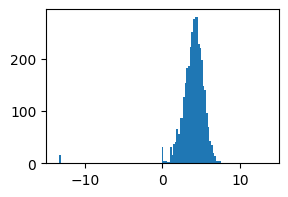

Progesterone Receptor AorB-Gd158_cell_sum


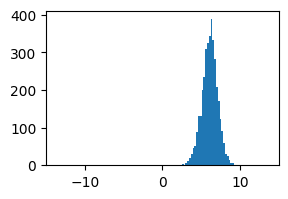

p53-Tb159_cell_sum


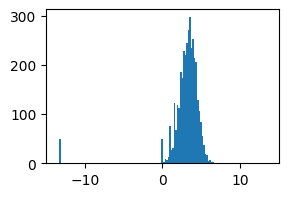

CD44-Gd160_cell_sum


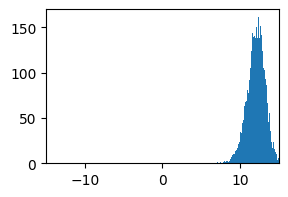

EpCAM-Dy161_cell_sum


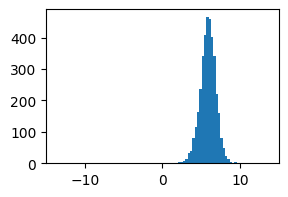

CD45-Dy162_cell_sum


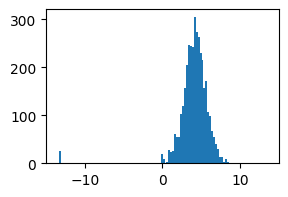

GATA3-Dy163_cell_sum


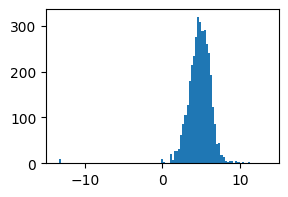

CD20-Dy164_cell_sum


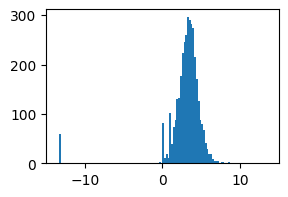

b-Catenin-Ho165_cell_sum


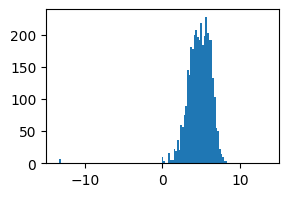

Carbonic Anhydrase IX-Er166_cell_sum


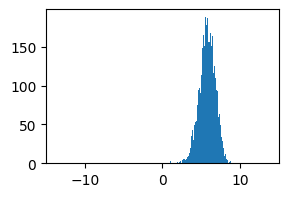

undefined-Er167_cell_sum


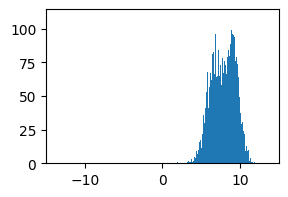

Ki-67-Er168_cell_sum


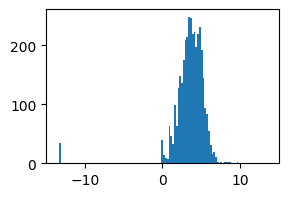

EGFR-Tm169_cell_sum


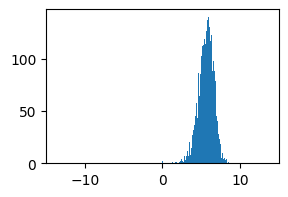

S6-Er170_cell_sum


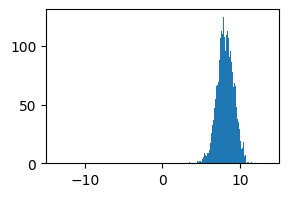

Sox9-Yb171_cell_sum


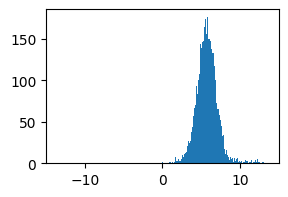

vWF-CD31-Yb172_cell_sum


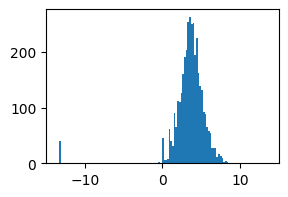

mTOR-Yb173_cell_sum


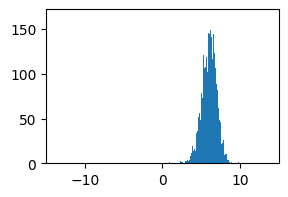

Cytokeratin 7-Yb174_cell_sum


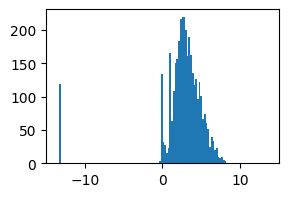

pan Cytokeratin-Keratin Epithelial-Lu175_cell_sum


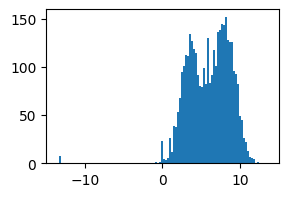

cleaved PARP-Cleaved Caspase3-Yb176_cell_sum


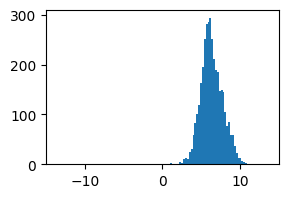

In [34]:
# plots distribution for each marker
check_feature_distribution(feature_summary_df=cytof_img.df_feature, features=cytof_img.features['cell_sum'])

### Feture log transform and percentile normalization
With feature extraction completed, the feature can then be normalized to make it easire for upcoming analyses. 
`feature_quantile_normalization`

q-th percenrile normalization with q: 75, 99


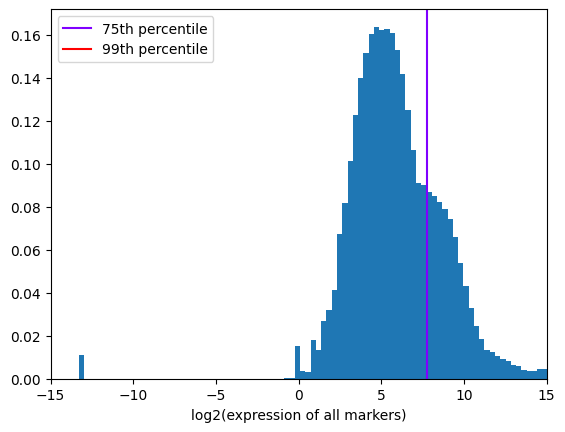

dict quantiles: {75: 216.73199462890625, 99: 73912.32312500008}


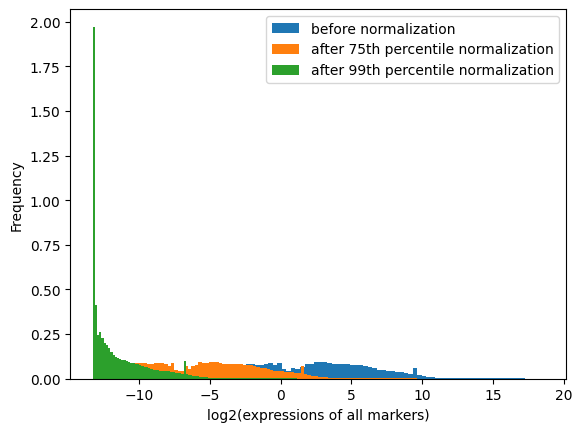

In [35]:
'''
(1) Calculate q-th percentile [75th and 99th] (default) for all single cell & single nuclei data (cell sum & nuclei sum of all markers)
(2) Use q-th percnetile to normalize each feature
(3) Attach normalized feature as new attributes to cytof_img
'''
print(f"q-th percenrile normalization with q: {', '.join(map(str, params.normalize_qs))}")
cytof_img.feature_quantile_normalization(qs=params.normalize_qs)

## Section 4. Save outputs

#### 1) Save single ROI parameters (can be used for cohort analyses)

In [36]:
# # save single ROI parameters
# params_save = vars(params)

# # (optional) remove those won't be used to process the cohort
# # params_save.pop('filename')
# # params_save.pop('outdir')
# params_save.pop('slide')
# params_save.pop('roi')

# yaml.dump(vars(params), open(os.path.join(outdir, "params.txt"), "w"))

#### 2) Save `CytofImage` class instance

In [37]:
savename_cytof_img = os.path.join(params.outdir, "cytof_img.pkl")
cytof_img.save_cytof(savename_cytof_img)

## Single ROI analyses
PhenoGraph clustering makes most sense to be performed on a cohort, other analyses including marker positive analyses was also originally class methods of CytofCohort's.  
To perform these analyses on this single ROI, first create a `CytofCohort` class instance.

In [38]:
from cytof.classes import CytofCohort

In [39]:
cytof_roi_name = f"{cytof_img.roi}-{cytof_img.roi}"
cytof_images = {cytof_roi_name: cytof_img}

cytof_img_cohort = CytofCohort(
    cytof_images=cytof_images, 
    dir_out=params.outdir, 
    cohort_name=f"cohort_{cytof_roi_name}")
cytof_img_cohort.batch_process_feature()

dict quantiles in batch process: {75: 216.73199462890625, 99: 73912.32312500008}


#### 1) Pheno-Graph

In [40]:
key_pheno = cytof_img_cohort.clustering_phenograph()  


The attribute name of the feature: df_feature_75normed_scaled
Finding 36 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.23211121559143066 seconds
Jaccard graph constructed in 1.6775543689727783 seconds
Wrote graph to binary file in 0.06031990051269531 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.698678
Louvain completed 21 runs in 1.5172438621520996 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 4.6670167446136475 seconds

9 communities found. The dictionary key for phenograph: 75normed_scaled_all_feature_36_all_markers.


Visualization in 2d - cohort-cohort


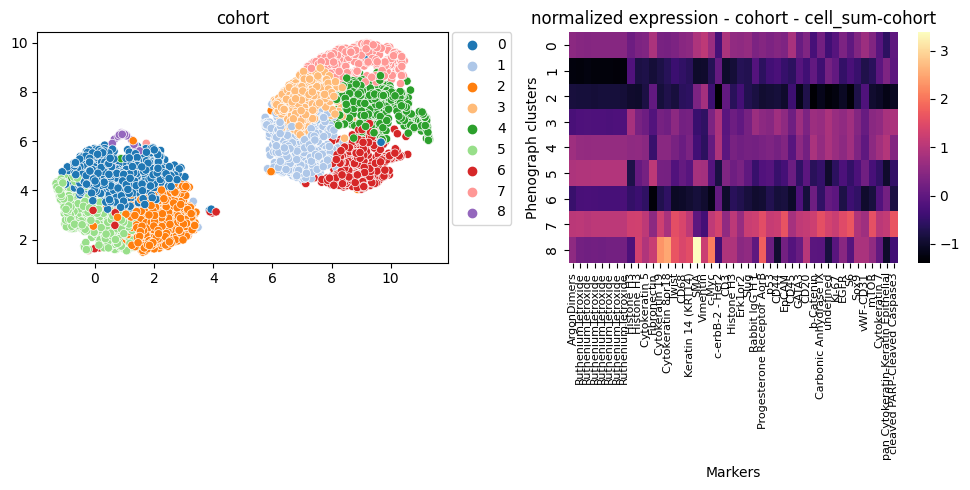

In [41]:
%matplotlib inline
df_feats, commus, cluster_protein_exps, figs, figs_scatter, figs_exps \
        = cytof_img_cohort.vis_phenograph(key_pheno=key_pheno, level="cohort", save_vis=False, 
                                          plot_together=True, show_plots=True, fig_width=5)


#### 2) Marker Positive

In [42]:
cytof_img_cohort.generate_summary()

Getting thresholds for cell sum of all markers.


['75normed_sum']

In [43]:
vis_marker = "CD68-Nd146" 

stain_nuclei, stain_cell, color_dict = cytof_img.visualize_marker_positive(
            marker=vis_marker,
            feature_type="normed",
            accumul_type="sum",
            normq=75,
            show_boundary=True,
            color_list=[(0,0,1), (0,1,0)], # negative, positive
            color_bound=(0,0,0),
            show_colortable=False)

Visualizing channels: CD68-Nd146, nuclei
Visualizing... 
CD68-Nd146 in red
nuclei in green



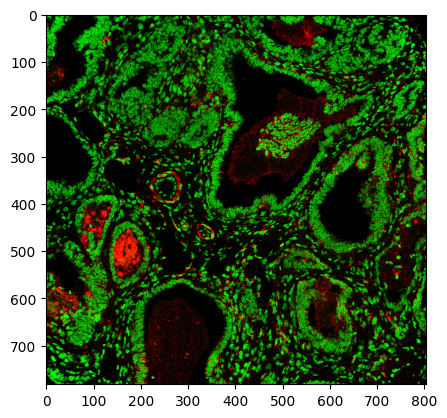

In [44]:
vis_channel_names = [vis_marker, "nuclei"]
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                visualize=True)

Visualizing channels: CD68-Nd146, nuclei
Visualizing... 
CD68-Nd146 in red
nuclei in green



(-0.5, 299.5, 299.5, -0.5)

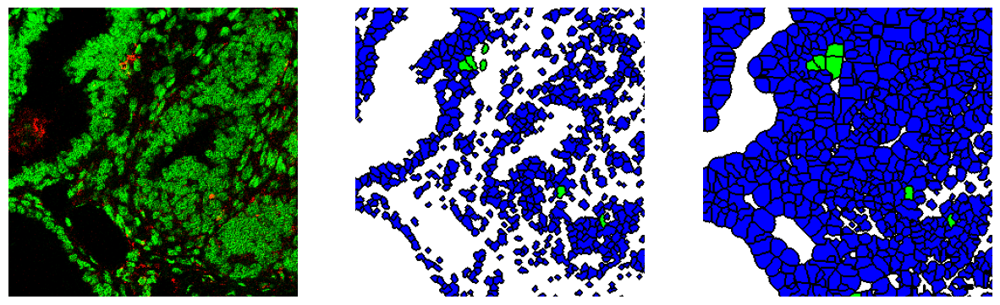

In [45]:
pseudoRGB, quantiles, color_pool = cytof_img.visualize_channels(channel_names=vis_channel_names, 
                                    visualize=False)

    # ## adjust brightness of channels
    # # adjust brightness of the red channel
    # pseudoRGB[..., 0] = np.array(np.clip(pseudoRGB[..., 0] / np.quantile(pseudoRGB[..., 0].reshape(-1), 0.95), 
    #                            0, 1) * 255, dtype=np.uint8)
    # # adjust brightness of the green channel
    # pseudoRGB[..., 1] = np.array(np.clip(pseudoRGB[..., 1] * 0.9, 0, 255), dtype=np.uint8)

r, c, _ = pseudoRGB.shape
maxr = min(r, 300)
maxc = min(c, 300)
fig, axs = plt.subplots(1,3,figsize=(15, 5))
axs[0].imshow(pseudoRGB[0:maxr, 0:maxc, :])
axs[0].axis('off')
axs[1].imshow(stain_nuclei[0:maxr, 0:maxc, :])
axs[1].axis('off')
axs[2].imshow(stain_cell[0:maxr, 0:maxc, :])
axs[2].axis('off')

#### Output marker positive related dataframes

In [46]:
# cytof_img.cell_count_75normed_sum.to_csv(os.path.join(outdir, "positive_cell_count.csv"))

# cytof_img.df_marker_positive_75normed_sum.to_csv(os.path.join(outdir, "marker_positive_summary.csv"))

Please reference `tutorial-figures.ipynb` for ROI and cohort level for additional downstream analysis [co-expression and spatial interaction]